**Goal**: Compare scanpy to seurat integration and clustering of mouse E12 and Jessa's 

In [1]:
from __future__ import annotations
import pandas as pd
import numpy as np
import scanpy as sc
import scanpy.external as sce
import anndata as ad
import warnings
warnings.filterwarnings("ignore")
import hdf5plugin #in case needed for h5ad reading (if previously saved with compression)
import decoupler as dc
import os
import seaborn as sns
from scipy.stats import median_abs_deviation


I ran remove_background.sh, which calls cellbender to remove background contamination in a way that is hopefully similar to soupX in R. I have to ask Sol and Anna if the 10X data was already processed somehow.

*There was a warning generated by an incompatibility between versions because I used python 3.13 when cellbender worked better with python 3.10/3.11. It should only affect the plots, but keep an eye on it and maybe rerun it eventually after downgrading python.

Edit: I reran it with 3.11 and had to remember to use this commit for cellbender and get 
  torch 1.13.1 because it all breaks otherwise

pip install --no-cache-dir -U git+https://github.com/broadinstitute/CellBender.git@4334e8966217c3591bf7c545f31ab979cdc6590d

Edit 2: The plotting issue's still there

In [2]:

path = "/home/sofia/Projects/etmr/defaria/scRNA/jessa/data/processed/jessa_all.h5ad"
jessa = sc.read_h5ad(path)

In [3]:
jessa.obs.columns


Index(['background_fraction', 'cell_probability', 'cell_size',
       'droplet_efficiency', 'n_raw', 'n_cellbender'],
      dtype='object')

In [4]:
# mitochondrial genes
jessa.var["mt"] = jessa.var_names.str.startswith("MT-")
# ribosomal genes
jessa.var["ribo"] = jessa.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
jessa.var["hb"] = jessa.var_names.str.contains("^HB[^(P)]")

In [5]:
sc.pp.calculate_qc_metrics(jessa, qc_vars=['mt', "ribo", "hb"], percent_top=None, log1p=False, inplace=True)

# --- Subset cells ---
jessa = jessa[
    jessa.obs['n_genes_by_counts'].between(200, 6000) &
    (jessa.obs['total_counts'] < 40000) &
    (jessa.obs['pct_counts_mt'] < 10),
    :
].copy()

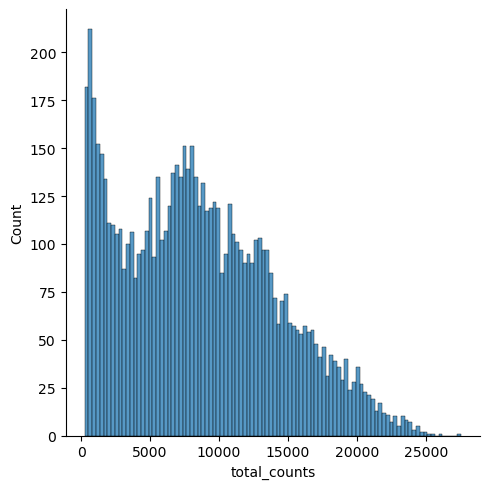

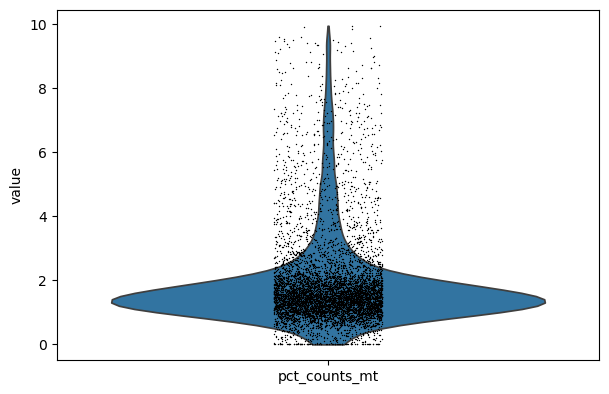

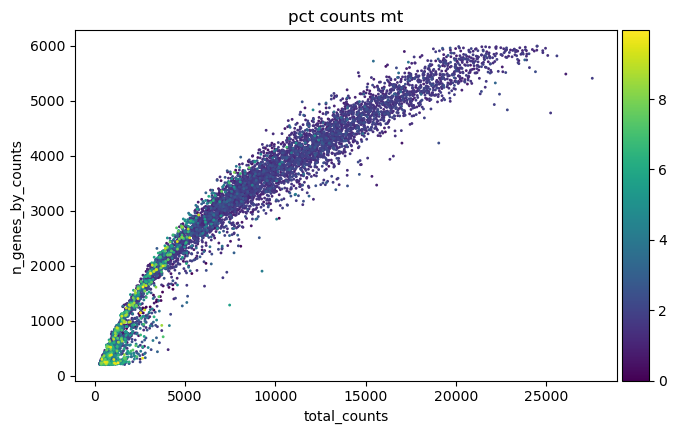

In [6]:
jessa.var_names_make_unique()
p1 = sns.displot(jessa.obs["total_counts"], bins=100, kde=False)
p2 = sc.pl.violin(jessa, "pct_counts_mt")
p3 = sc.pl.scatter(jessa, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [7]:
jessa

AnnData object with n_obs × n_vars = 7183 × 57906
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swapping_fraction_dist_params', 'target_false_positive_rate'
    obsm: 'cellbender_embedding'
    laye

In [8]:
# --- Normalize, find variable genes, scale ---
sc.pp.highly_variable_genes(jessa, flavor='seurat_v3', layer="cellbender") #identify highly variable genes, IMPORTANT TO DO BEFORE NORMALIZATION AND LOG-TRANSFORMATION
sc.pp.normalize_total(jessa, target_sum=1e4, layer="cellbender") #library size normalization
sc.pp.log1p(jessa, layer="cellbender") #log-transformation

In [9]:
jessa.layers["scale.data"] = jessa.layers["cellbender"].copy()
sc.pp.regress_out(jessa, keys=['total_counts', 'total_counts_mt'], layer="scale.data")
sc.pp.scale(jessa, layer="scale.data")

In [10]:
jessa

AnnData object with n_obs × n_vars = 7183 × 57906
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swap

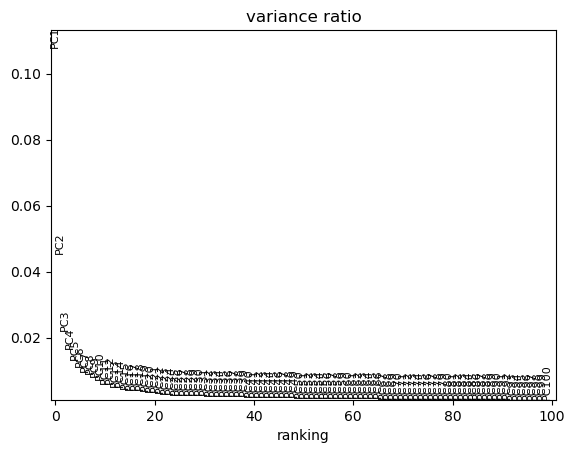

In [11]:
sc.pp.pca(jessa, use_highly_variable=True,  n_comps=100, layer="scale.data")
sc.pl.pca_variance_ratio(jessa, n_pcs=100, log=False)

In [12]:
jessa

AnnData object with n_obs × n_vars = 7183 × 57906
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train_elbo', 'learning_curve_train_epoch', 'swap

In [26]:
sc.pp.neighbors(
                jessa,
                n_neighbors=20,
                n_pcs=30
            )

            # UMAP
sc.tl.umap(
                jessa
            )

            # Leiden
sc.tl.leiden(
                jessa,
                resolution=.8
            )


In [14]:
jessa.obs

,background_fraction,cell_probability,cell_size,droplet_efficiency,n_raw,n_cellbender,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,leiden
barcode,,,,,,,,,,,,,,,
GATCGTAAGCCCAGCT-1,0.003003,0.999955,15591.213867,1.819986,27636,27553,5409,27553,484,1.756615,3345,12.140239,2,0.007259,15
CGGCTAGTCGCACTCT-1,0.000613,0.999955,12288.462891,2.229043,26103,26087,5486,26087,220,0.843332,9781,37.493771,1,0.003833,0
CTGATAGAGCTACCGC-1,0.000703,0.999955,12950.321289,2.068654,25611,25593,5816,25593,477,1.863791,7289,28.480444,0,0.000000,0
GTTCGGGTCTCACATT-1,0.005711,0.999955,14627.648438,1.793697,25390,25245,4778,25245,400,1.584472,3326,13.174886,6,0.023767,15
TCCCGATAGTAGGCCA-1,0.000836,0.999955,13068.544922,2.009561,25107,25086,5824,25086,351,1.399187,6003,23.929682,1,0.003986,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TACGGGCCAGGACCCT-1,0.348623,0.863641,1238.353760,0.727437,436,284,209,284,6,2.112676,94,33.098592,0,0.000000,10
CTCGTACTCAACACCA-1,0.327981,0.843552,1240.208130,0.725126,436,293,209,293,0,0.000000,126,43.003413,0,0.000000,9
TTGTAGGTCTTTACGT-1,0.236842,0.605276,1207.625366,0.737544,418,319,246,319,0,0.000000,107,33.542320,0,0.000000,9


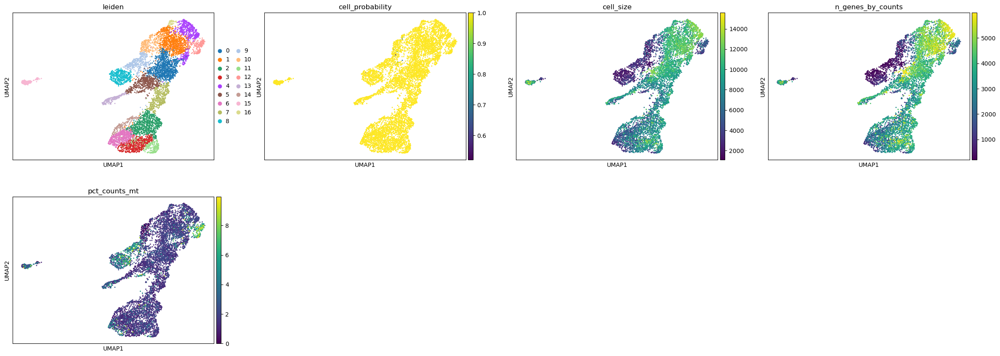

In [15]:
sc.pl.umap(jessa, color=["leiden", "cell_probability", "cell_size", "n_genes_by_counts", "pct_counts_mt"])

In [16]:
import zipfile
import pooch

p_zip = pooch.retrieve(
    "https://www.dropbox.com/s/3dby3bjsaf5arrw/cell_cycle_vignette_files.zip?dl=1",
    known_hash="sha256:6557fe2a2761d1550d41edf61b26c6d5ec9b42b4933d56c3161164a595f145ab",
    path="../data",
)

with zipfile.ZipFile(p_zip, "r") as f_zip:
    f_csv = zipfile.Path(f_zip, "nestorawa_forcellcycle_expressionMatrix.txt").open()
    cell_cycle_genes = zipfile.Path(f_zip, "regev_lab_cell_cycle_genes.txt").read_text().splitlines()


In [17]:
s_genes = [x for x in cell_cycle_genes[:43] if x in jessa.var_names]
g2m_genes = [x for x in cell_cycle_genes[43:] if x in jessa.var_names]
cell_cycle_genes = [*s_genes, *g2m_genes]

In [18]:
sc.tl.score_genes_cell_cycle(jessa, s_genes=s_genes, g2m_genes=g2m_genes, layer="scale.data")

... storing 'phase' as categorical


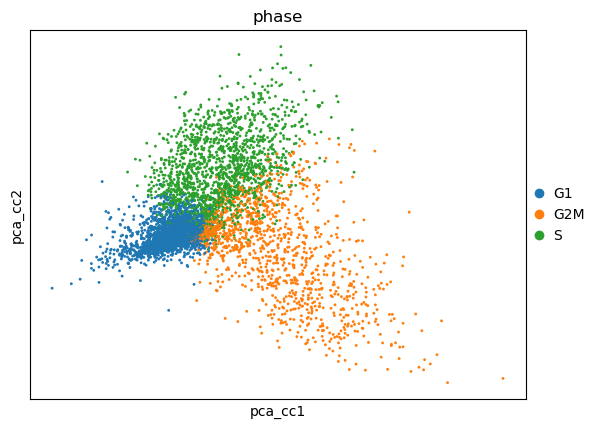

In [19]:
jessa_cc_genes = jessa[:, cell_cycle_genes].copy()
sc.tl.pca(jessa_cc_genes, layer="scale.data", key_added="pca_cc")
sc.pl.embedding(jessa_cc_genes, color="phase", basis="pca_cc")

In [20]:
jessa

AnnData object with n_obs × n_vars = 7183 × 57906
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'S_score', 'G2M_score', 'phase'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train

In [21]:

sc.tl.rank_genes_groups(jessa, groupby="leiden",  method="wilcoxon", layer="cellbender")

... storing 'phase' as categorical


In [ ]:
df = sc.get.rank_genes_groups_df(jessa, group=None)
df.to_csv("/home/sofia/Projects/etmr/defaria/scRNA/jessa/data/processed/rank_genes_groups.csv", index=False)
df = df.sort_values(by="logfoldchanges", ascending=False)

In [30]:
df

,group,names,scores,logfoldchanges,pvals,pvals_adj
868596,15,AIF1,20.435555,33.381973,8.077126e-93,6.681629e-89
868632,15,TREM2,17.966829,32.429344,3.544009e-72,4.366370e-69
868627,15,MS4A7,18.103981,32.205292,2.964489e-73,4.087183e-70
868647,15,OLR1,17.006769,32.091873,7.316221e-65,6.139900e-62
868693,15,CCL3L3,15.498104,31.742836,3.572775e-54,1.510110e-51
...,...,...,...,...,...,...
521126,8,MBD5,-25.922819,-30.747768,3.683656e-148,5.332644e-145
521131,8,EXT1,-26.138176,-30.994757,1.343140e-150,2.222167e-147
520994,8,DAB1,-21.801012,-31.131012,2.269475e-105,6.704910e-103
521024,8,NCKAP5,-22.271790,-31.271595,6.937576e-110,2.434711e-107


In [ ]:
df_filt = df.copy()
df_filt = df_filt.groupby('logfoldchanges').head(50).reset_index(drop=True)
df_filt

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,15,AIF1,20.435555,33.381973,8.077126e-93,6.681629e-89
1,15,TREM2,17.966829,32.429344,3.544009e-72,4.366370e-69
2,15,MS4A7,18.103981,32.205292,2.964489e-73,4.087183e-70
3,15,OLR1,17.006769,32.091873,7.316221e-65,6.139900e-62
4,15,CCL3L3,15.498104,31.742836,3.572775e-54,1.510110e-51
...,...,...,...,...,...,...
568576,8,MBD5,-25.922819,-30.747768,3.683656e-148,5.332644e-145
568577,8,EXT1,-26.138176,-30.994757,1.343140e-150,2.222167e-147
568578,8,DAB1,-21.801012,-31.131012,2.269475e-105,6.704910e-103
568579,8,NCKAP5,-22.271790,-31.271595,6.937576e-110,2.434711e-107


In [39]:
markerslist = {
"astrocytes" : ["APOE", "SLC1A3", "GFAP", "SLC1A2"],
  "microglia" : ["AIF1", "TYROBP"],
  "ipc" : ["ASCL1", "GADD45G", "BTG2", "CCND2"],
  "rdg" : ["PAX6", "SOX2", "VIM", "NES", "CCND1", "PTN", "HMGA2", "HES1", "HES5", "FABP7", "SLC1A3"],
  "nec" : ["PRTG",  "WNT8B", "ID3"],
  "neuron" : ["SNAP25", "DCX", "DNER"],
  "gabaergic" : ["GAD1", "GAD2"],
  "cycling" : ["TOP2A", "MKI67", "AURKA"]
}


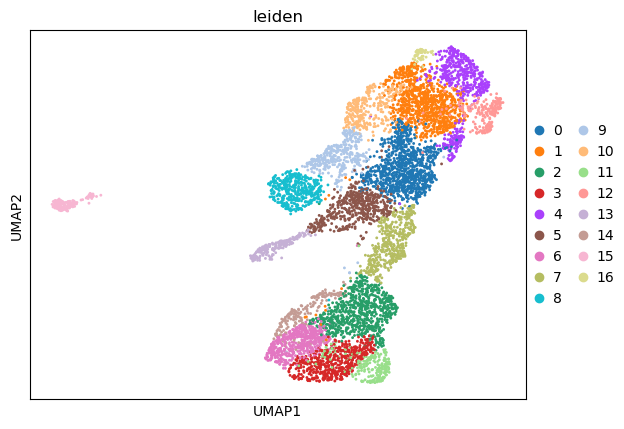

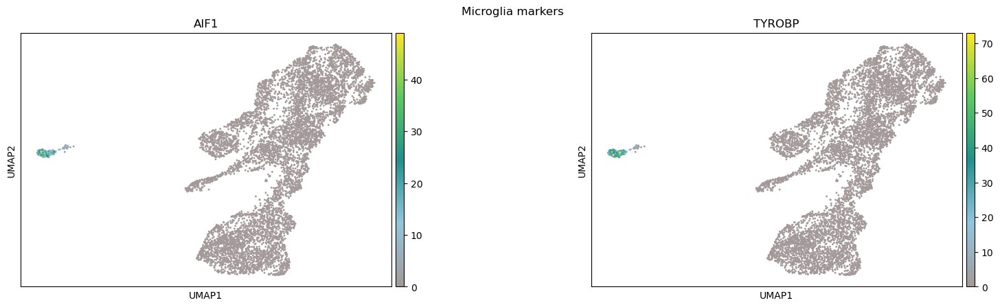

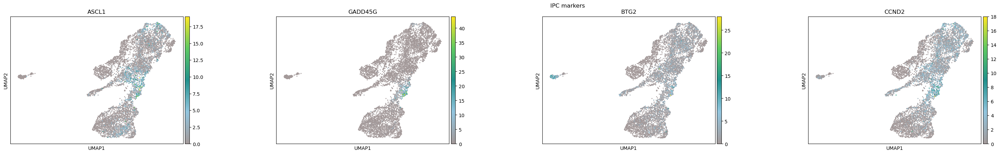

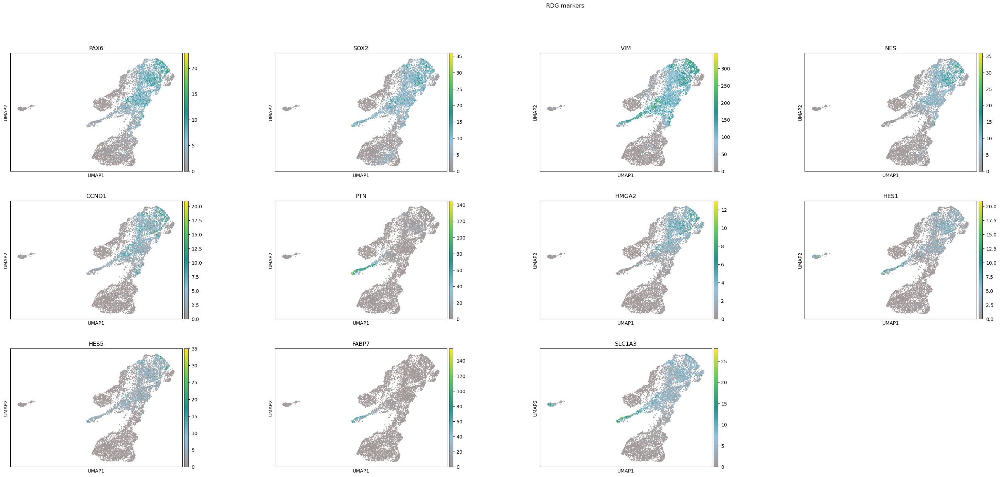

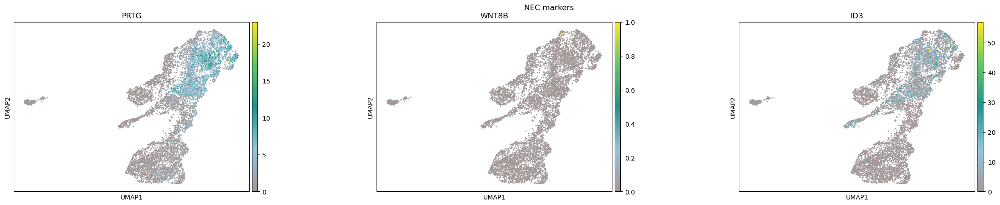

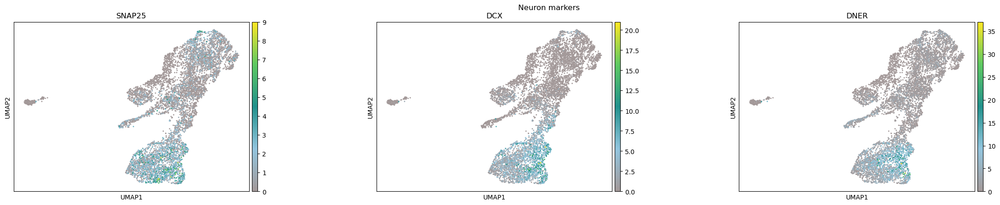

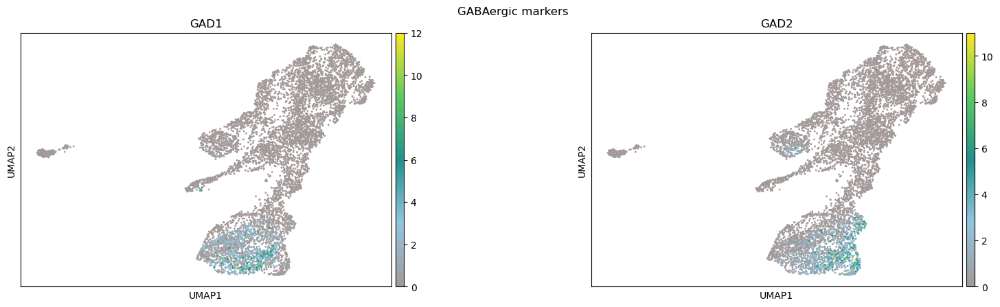

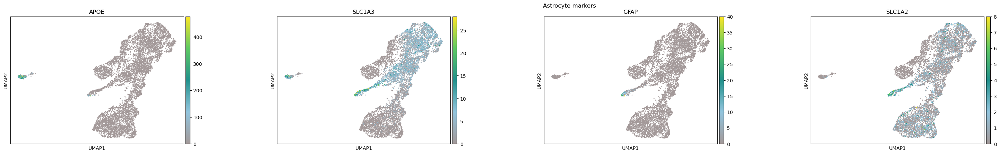

In [56]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

custom = LinearSegmentedColormap.from_list(
    "custom",
    ["#a39999", "#92c5de", "#21918c", "#5ec962", "#fde725"]
)

sc.pl.embedding(jessa, basis="umap", color="leiden", wspace=0.4)
sc.pl.embedding(jessa, basis="umap", color=markerslist["microglia"], wspace=0.4, show=False,  color_map=custom)
plt.suptitle("Microglia markers")
plt.show()
sc.pl.embedding(jessa, basis="umap", color=markerslist["ipc"], wspace=0.4, show=False,  color_map=custom)
plt.suptitle("IPC markers")
plt.show()
sc.pl.embedding(jessa, basis="umap", color=markerslist["rdg"], wspace=0.4, show=False,  color_map=custom)
plt.suptitle("RDG markers")
plt.show()
sc.pl.embedding(jessa, basis="umap", color=markerslist["nec"], wspace=0.4, show=False,  color_map=custom)
plt.suptitle("NEC markers")
plt.show()
sc.pl.embedding(jessa, basis="umap", color=markerslist["neuron"], wspace=0.4, show=False,  color_map=custom)
plt.suptitle("Neuron markers")
plt.show()
sc.pl.embedding(jessa, basis="umap", color=markerslist["gabaergic"], wspace=0.4, show=False,  color_map=custom)
plt.suptitle("GABAergic markers")
plt.show()
sc.pl.embedding(jessa, basis="umap", color=markerslist["astrocytes"], wspace=0.4, show=False, color_map=custom)
plt.suptitle("Astrocyte markers")
plt.show()

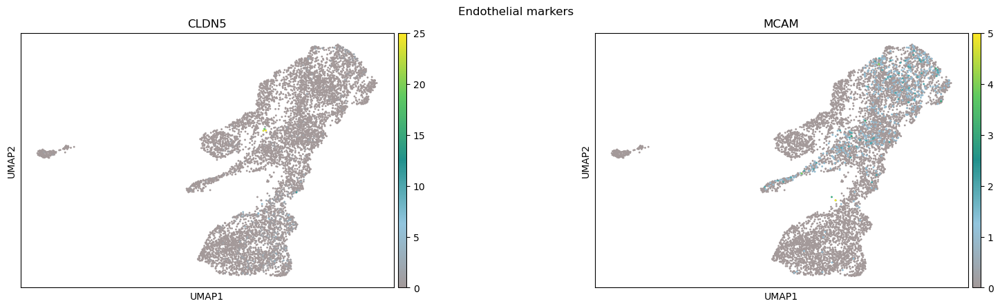

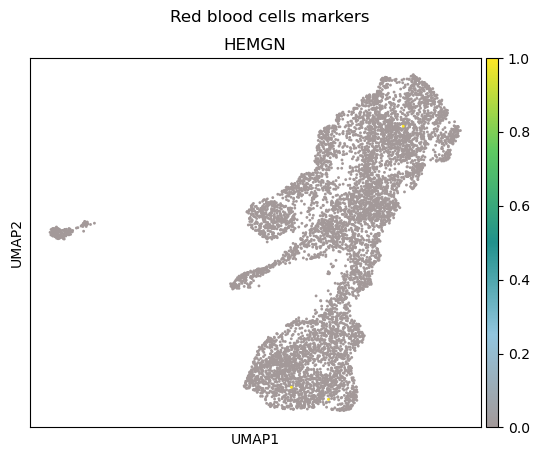

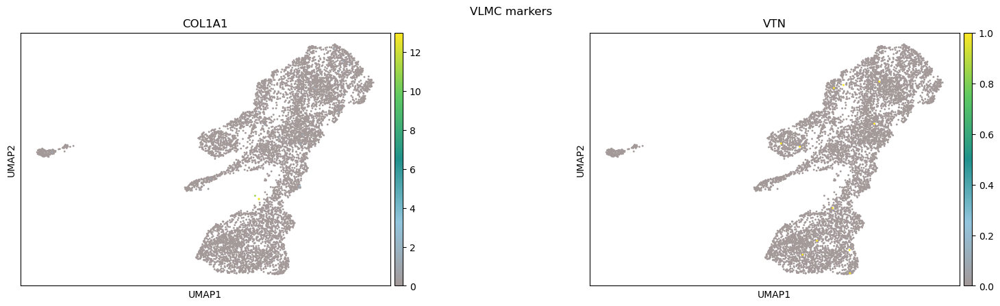

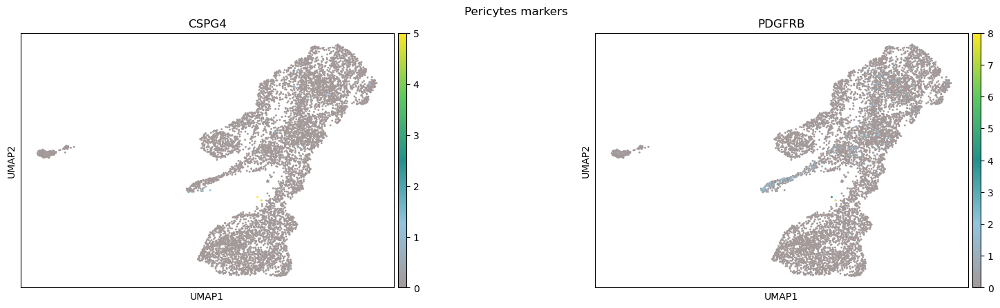

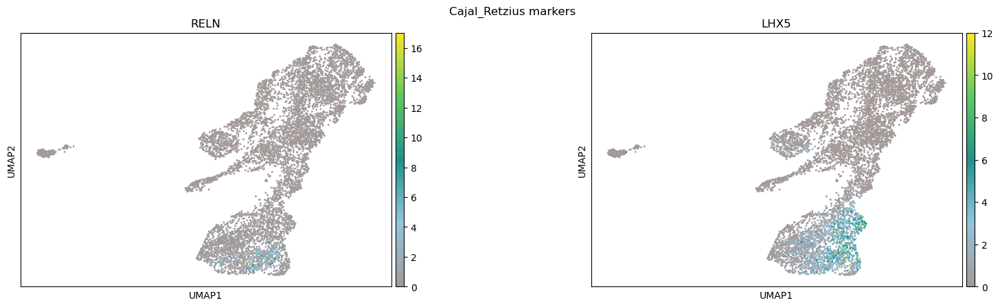

...

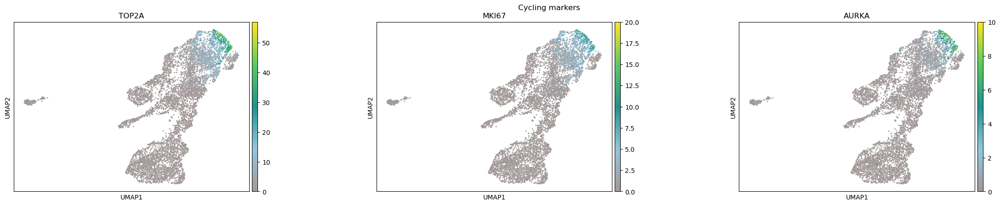

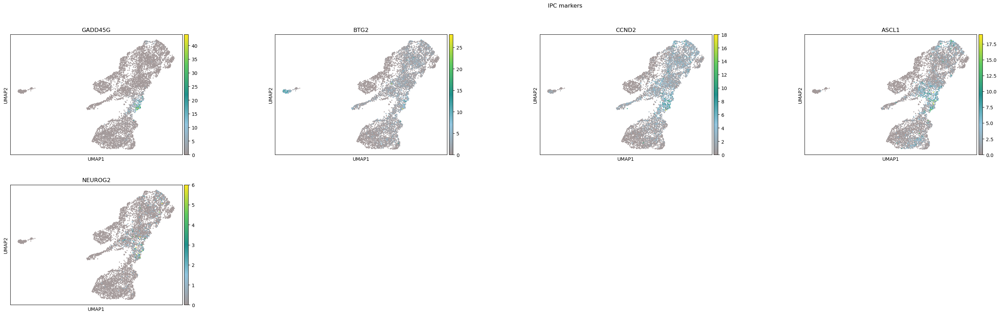

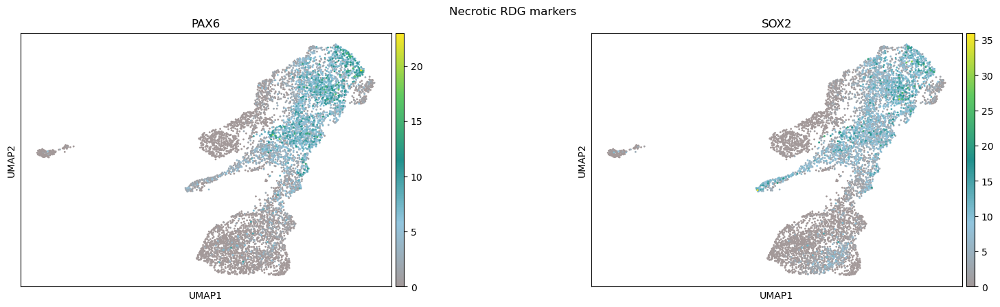

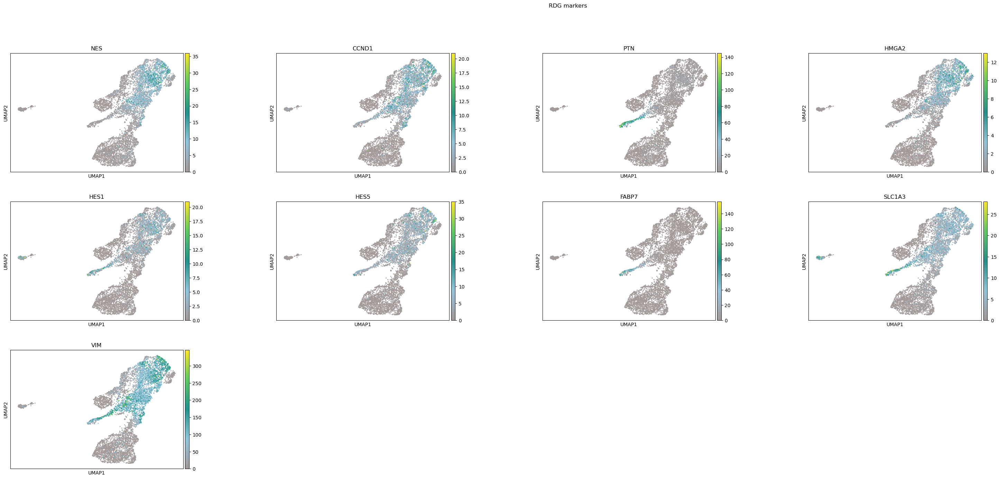

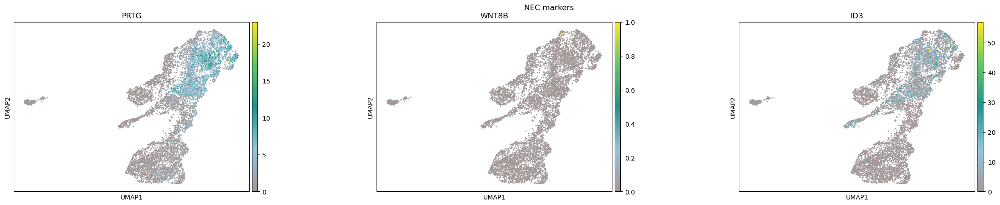

In [ ]:
#Anotacion provicional

endothelial = ["CLDN5", "MCAM"]
red_blood_cells = ["HEMGN"]
vlmc = ["COL1A1", "VTN"]
pericytes = ["CSPG4", "PDGFRB"]
cajal_retzius = ["RELN", "LHX5"]
astrocytes = ["APOE", "ALDH1L1", "SLC1A3", "GFAP", "SLC1A2", "FABP7"]
oligodendrocytes = ["OLIG1", "OLIG2", "PDGFRA", "CSPG4", "NKX2-2", "SOX10"]
microglia = ["AIF1", "TMEM119", "TYROBP"]
neu_general = ["SNAP25", "DCX", "DNER"]
interneuron = ["GAD1", "GAD2", "DLX2", "DLX1"]
excitatory_neu = ["NEUROD2", "NEUROD6", "SLC17A6"]
cycling = ["TOP2A", "MKI67", "AURKA"]
ipc = ["GADD45G", "BTG2", "CCND2", # general
         "ASCL1",                    # inhibitorias
         "NEUROG2"]  
nec_rdg = ["PAX6", "SOX2"]
rdg = ["NES", "CCND1", "PTN", "HMGA2", "HES1", "HES5", "FABP7", "SLC1A3", "VIM"]
nec = ["PRTG", "WNT8B", "ID3"]

prov_ann = {
    "Endothelial": endothelial,
    "Red blood cells": red_blood_cells,
    "VLMC": vlmc,
    "Pericytes": pericytes,
    "Cajal_Retzius": cajal_retzius,
    "Astrocytes": astrocytes,
    "Oligodendrocytes": oligodendrocytes,
    "Microglia": microglia,
    "Neurons (general)": neu_general,
    "Interneurons": interneuron,
    "Excitatory_neurons": excitatory_neu,
    "Cycling": cycling,
    "IPC": ipc,
    "Necrotic RDG": nec_rdg,
    "RDG": rdg,
    "NEC": nec,
}

for name, genes in prov_ann.items(): 
    sc.pl.embedding(jessa, basis="umap", color=genes, wspace=0.4, show=False, color_map=custom)
    plt.suptitle(f"{name} markers")
    plt.show()


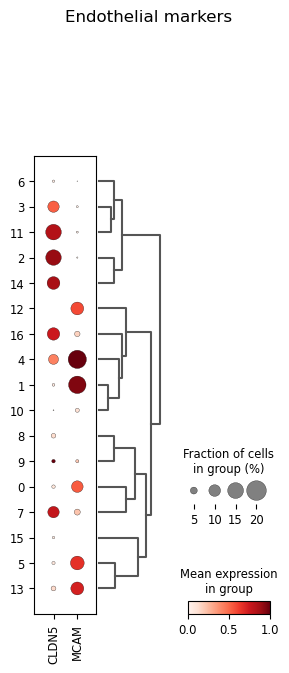

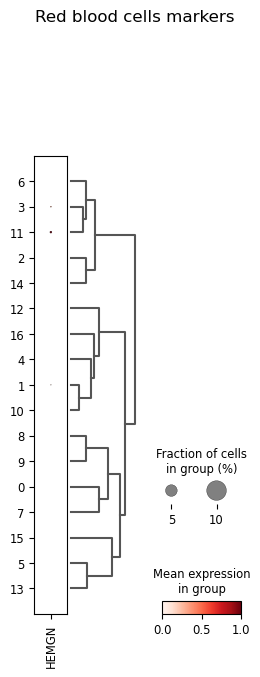

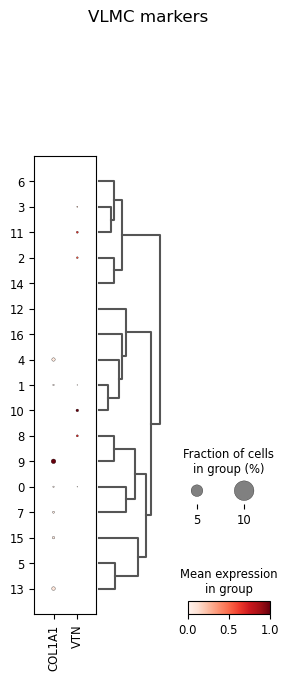

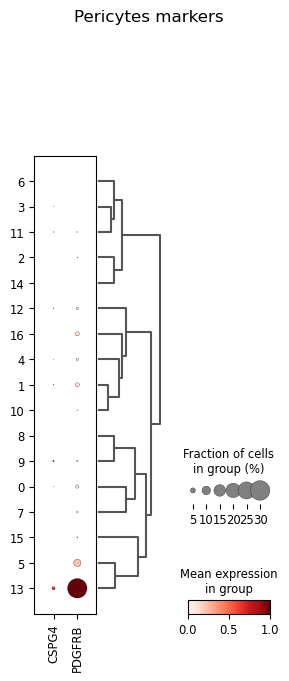

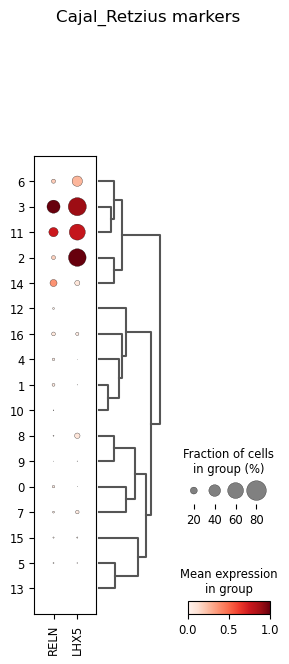

...

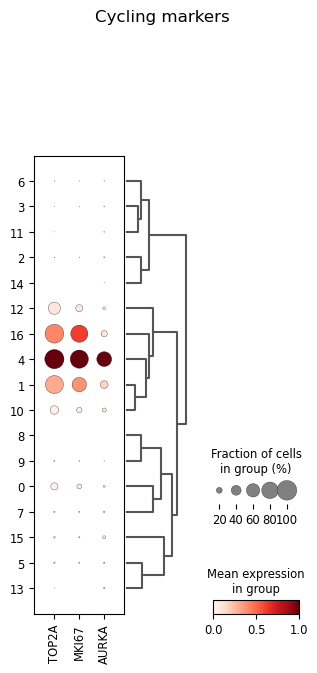

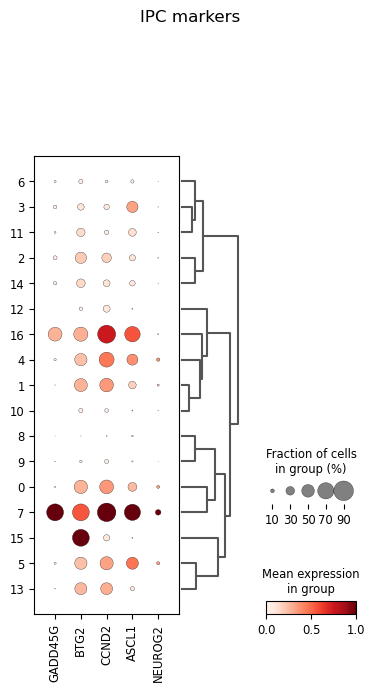

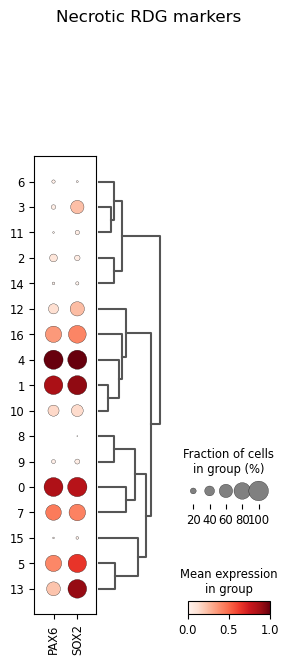

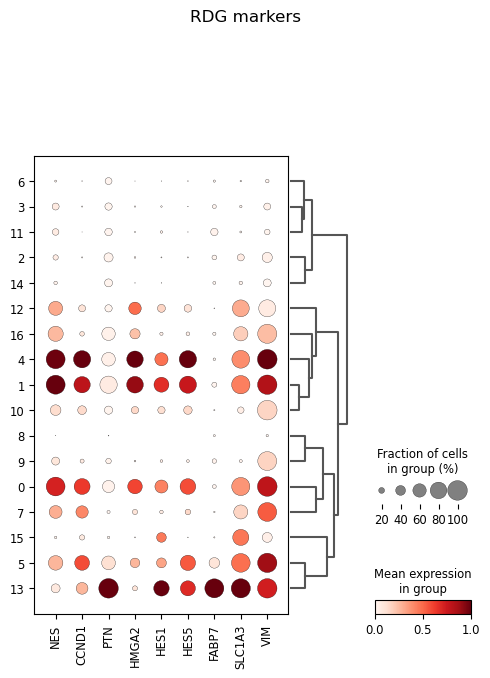

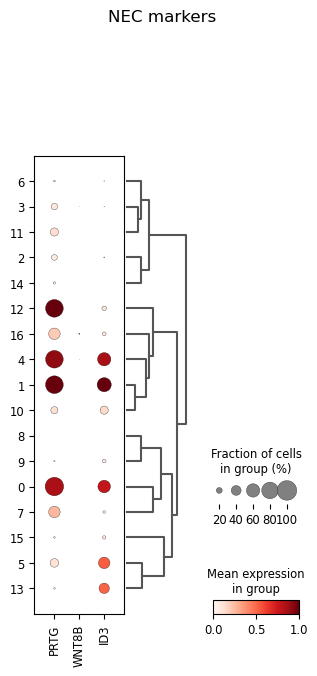

In [ ]:
sc.tl.dendrogram(jessa, groupby="leiden")

for name, genes in prov_ann.items(): 
    sc.pl.dotplot(jessa, var_names=genes, groupby="leiden", standard_scale="var", show=False, dendrogram=True)
    plt.suptitle(f"{name} markers")
    plt.show()

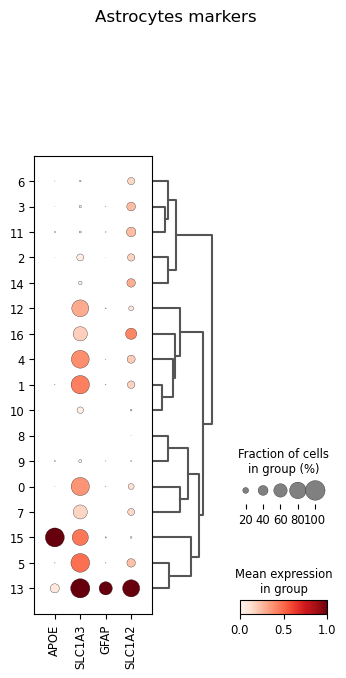

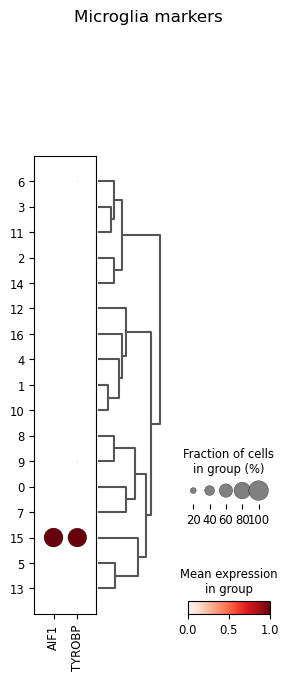

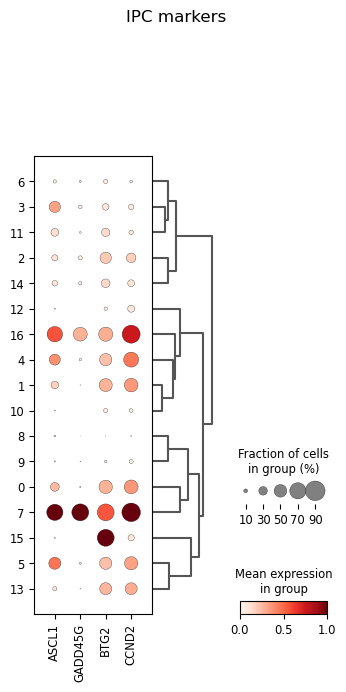

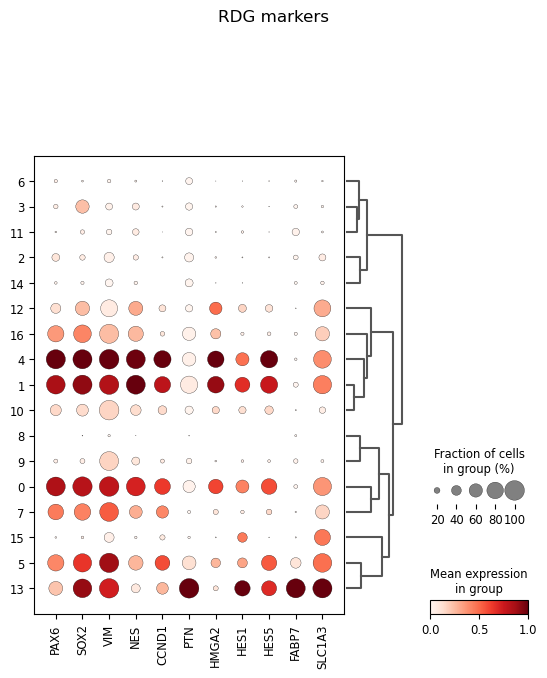

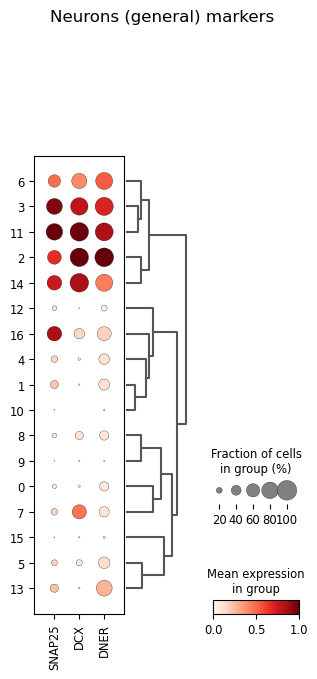

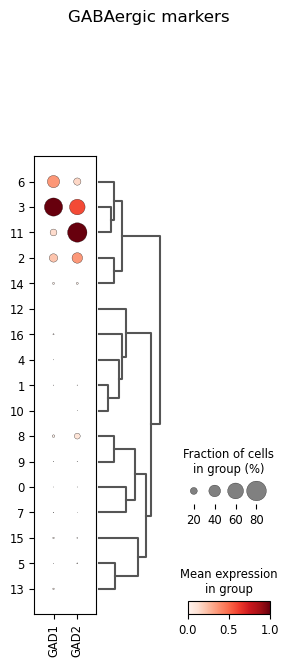

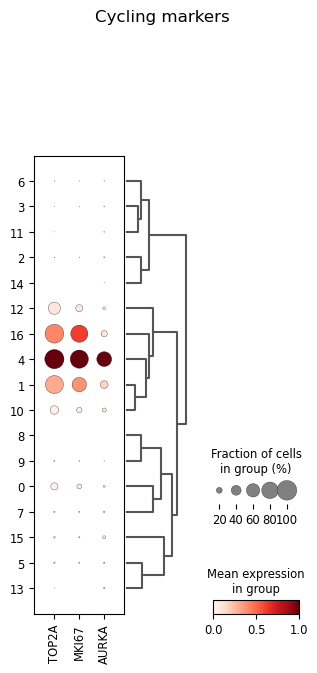

In [69]:
etmr1_markers = {
  "Astrocytes": ["APOE", "SLC1A3", "GFAP", "SLC1A2"], # ASTROCITOS
  "Microglia": ["AIF1", "TYROBP"],  # MICROGLIA
  "IPC": ["ASCL1", "GADD45G", "BTG2", "CCND2"], # IPC
  "RDG": ["PAX6", "SOX2", "VIM", "NES", "CCND1", "PTN", "HMGA2", "HES1", "HES5", "FABP7", "SLC1A3"], # RDG
  "Neurons (general)": ["SNAP25", "DCX", "DNER"], # NEURONA
  "GABAergic": ["GAD1", "GAD2"], # GABAÉRGICAS
  "Cycling": ["TOP2A", "MKI67", "AURKA"] # Cycling
}

for name, genes in etmr1_markers.items(): 
    sc.pl.dotplot(jessa, var_names=genes, groupby="leiden", standard_scale="var", show=False, dendrogram=True)
    plt.suptitle(f"{name} markers")
    plt.show()


In [59]:
jessa

AnnData object with n_obs × n_vars = 7183 × 57906
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'n_raw', 'n_cellbender', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'S_score', 'G2M_score', 'phase'
    var: 'ambient_expression', 'feature_type', 'genome', 'gene_id', 'cellbender_analyzed', 'n_raw', 'n_cellbender', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'cell_size_lognormal_std', 'empty_droplet_size_lognormal_loc', 'empty_droplet_size_lognormal_scale', 'estimator', 'features_analyzed_inds', 'fraction_data_used_for_testing', 'learning_curve_learning_rate_epoch', 'learning_curve_learning_rate_value', 'learning_curve_test_elbo', 'learning_curve_test_epoch', 'learning_curve_train

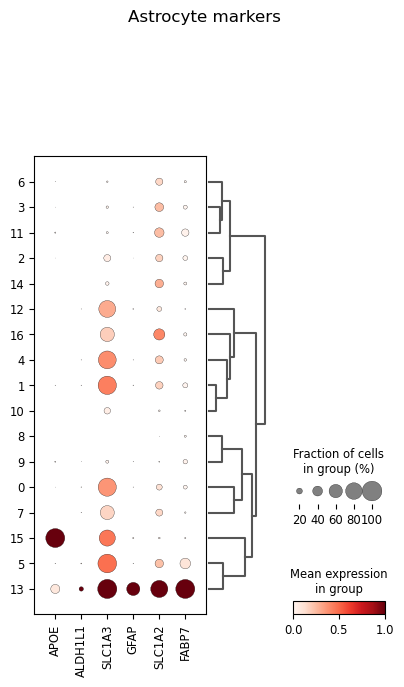

In [ ]:
cluster_names = {
    "0": "Nec_RDG",
    "1": "Nec_RDG",
    "2": "Neurons (general)",
    "3": "Neurons (GABAergic)",
    "4": "Cycling_RDG",
    "5": "Nec_RDG",
    "6": "Neurons (GABAergic)",
    "7": "IPC",
    "8": "unknown",
    "9": "unknown_RDG",
    "10": "Nec_RDG",
    "11": "Neurons (GABAergic)",
    "12": "Nec_RDG",
    "13": "Astrocytes",
    "14": "Neurons",
    "15": "Microglia",
    "16": "IPC"
}


# Now compare to SoupX

In [ ]:
path = "/home/sofia/Projects/etmr/defaria/scRNA/jessa/data/raw/raw_feature_bc_matrix/"
jessa_raw = sc.read_10x_mtx(path)


In [ ]:
jessa_raw

AnnData object with n_obs × n_vars = 600080 × 57906
    var: 'gene_ids', 'feature_types'

In [ ]:
# mitochondrial genes
jessa_raw.var["mt"] = jessa_raw.var_names.str.startswith("MT-")
# ribosomal genes
jessa_raw.var["ribo"] = jessa_raw.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
jessa_raw.var["hb"] = jessa_raw.var_names.str.contains("^HB[^(P)]")

sc.pp.calculate_qc_metrics(
    jessa_raw, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
jessa_raw

AnnData object with n_obs × n_vars = 600080 × 57906
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

... storing 'feature_types' as categorical


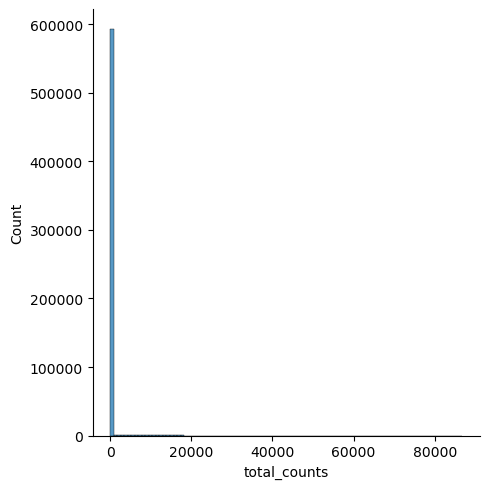

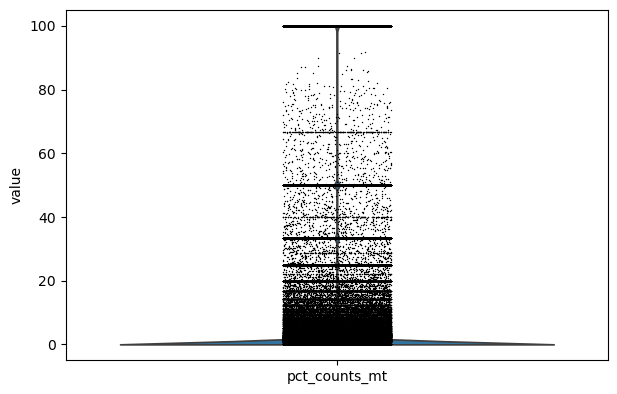

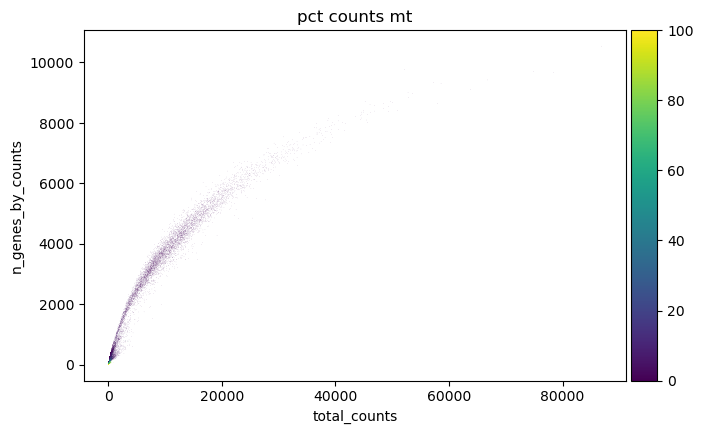

In [ ]:
p1 = sns.displot(jessa_raw.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(jessa_raw, "pct_counts_mt")
p3 = sc.pl.scatter(jessa_raw, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [ ]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [ ]:
jessa_raw.obs["outlier"] = (
    is_outlier(jessa_raw, "log1p_total_counts", 5)
    | is_outlier(jessa_raw, "log1p_n_genes_by_counts", 5)
    | is_outlier(jessa_raw, "pct_counts_in_top_20_genes", 5)
)
jessa_raw.obs.outlier.value_counts()

outlier
False    514540
True      85540
Name: count, dtype: int64

In [ ]:
jessa_raw.obs["mt_outlier"] = is_outlier(jessa_raw, "pct_counts_mt", 3) | (
    jessa_raw.obs["pct_counts_mt"] > 8
)
jessa_raw.obs.mt_outlier.value_counts()

mt_outlier
False    565683
True      34397
Name: count, dtype: int64

In [ ]:
print(f"Total number of cells: {jessa_raw.n_obs}")
jessa_raw = jessa_raw[(~jessa_raw.obs.outlier) & (~jessa_raw.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {jessa_raw.n_obs}")

Total number of cells: 600080
Number of cells after filtering of low quality cells: 487202


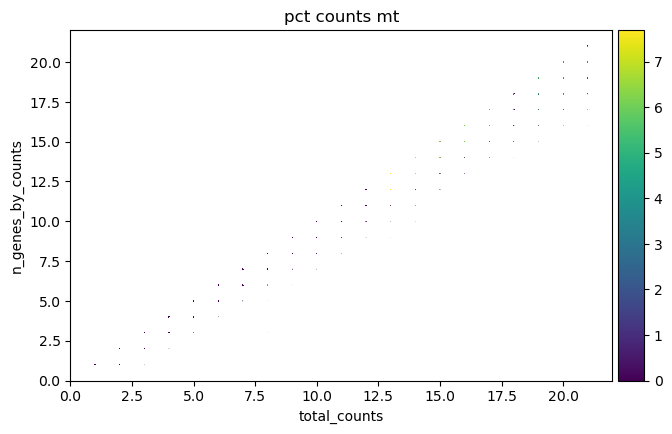

In [ ]:
p1 = sc.pl.scatter(jessa_raw, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

# dropletQC

nf_data_etmr1 <- nuclear_fraction_tags("//10.128.4.102/omics/Analyzed_data/SinglecellRNAseq_mouse_AnnaPrieto_SoledadPerez/data/Jessa/Jessa_cellranger/ETMR1/outs", tiles = 1, cores = 8, verbose = FALSE)
write.csv(nf_data_etmr1, "nf_data_etmr1.csv")
nf_data_etmr1 <- read.csv("nf_data_etmr1.csv")